# Advanced Lane Finding Project - [P2_02_01_Video_Pipeline.ipynb](./P2_02_01_Video_Pipeline.ipynb)

This notebook processes all video files in the project, as well as the test images using the same pipeline.

All output videos can be found in the [./output_videos/](./output_videos/) folder.

All output images can be found in the [./output_images/](./output_images/) folder.

### Camera Calibration

Prior to running through the video pipeline, the camera must be calibrated, and the images must be undistorted.  In other words, the camera matrix and distortion coefficients must first be computed so that each frame of the video may be undistorted as part of the pipeline.

In [1]:
# Camera Calibration
# Compute the camera matrix and distortion coefficients.

import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.path import Path        # Draw polyline for transform points
import matplotlib.patches as patches    # Draw polyline for transform points
import os
from os import path
import scipy.misc          # Easily save thresholded images from 64-bit matrices

%matplotlib qt
%matplotlib inline



def cal_undistort(img, objpoints, imgpoints):
    
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[1::-1], None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    return undist



# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = sorted(glob.glob('./camera_cal/calibration*.jpg'))

# Step through the list of provided calibration images and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners (9 x 6)
    ret, corners = cv2.findChessboardCorners(gray, (9, 6), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        
# Apply identified corners to undistort images
for fname in images:
    img = cv2.imread(fname)
    undistorted_img = cal_undistort(img, objpoints, imgpoints)
        

### Video Pipeline

In [2]:
# Video Pipeline
# Provide a link to the final video output.  
# The pipeline should perform reasonably well on the entire project video.  
# In other words, wobbly lines are acceptable, 
# but catastrophic failures that would cause the car to drive off the road are not!.

    
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML



# Define class to save data
class Lane_Data:
    leftx = []
    lefty = []
    rightx = []
    righty = []
    out_img = []
    left_fit = []
    right_fit = []
    
    

# Define class for transform vertices
class vt:
    # Create ROI vertices, starting from Top Right (TR), clockwise 
    vertex_TR = (685,  450)
    vertex_BR = (1099, 720)
    vertex_BL = (223,  720)
    vertex_TL = (597,  450)

    # Create transformed vertices, starting from Top Right (TR), clockwise 
    vertex_TR_xfm = (980, 0)
    vertex_BR_xfm = (980, 720)
    vertex_BL_xfm = (300, 720)
    vertex_TL_xfm = (300, 0)
    
    
    
# Define a function that applies Sobel x or y, 
# then takes an absolute value and applies a threshold.
def abs_sobel_thresh(img, orient, sobel_kernel, thresh):
    
    # Convert to grayscale
    # gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    gray = img
    
    # Take the derivative in x or y given orient = 'x' or 'y'
    if orient == 'x':
        #print("Calculating the derivative (Sobel) in the", orient, "direction.")
        sobel_gray = cv2.Sobel(gray, cv2.CV_64F, 1, 0, sobel_kernel) # Derivative in the x-direction
    elif orient == 'y':
        #print("Calculating the derivative (Sobel) in the", orient, "direction.")
        sobel_gray = cv2.Sobel(gray, cv2.CV_64F, 0, 1, sobel_kernel) # Derivative in the y-direction
    else:
        # print("I cannot Sobel in the", orient, "direction!")
        # print("Calculating the derivative (Sobel) in the", orient, "direction.")
        sobel_gray = cv2.Sobel(gray, cv2.CV_64F, 1, 0, sobel_kernel) # Derivative in the x-direction

    # Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel_gray)

    # Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))

    # Create a mask of 1's where the scaled gradient magnitude is > thresh_min and < thresh_max
    sobel_binary = np.zeros_like(scaled_sobel)
    sobel_binary[(scaled_sobel > thresh[0]) & (scaled_sobel < thresh[1])] = 1

    # 6) Return this mask as your binary_output image
    abs_sobel_thresh_binary_output = np.copy(sobel_binary)
    
    return abs_sobel_thresh_binary_output
    

# Define a function that applies Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold    
def mag_thresh(img, sobel_kernel, mag_thresh):
    
    # 1) Convert to grayscale
    # gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    gray = img
    
    # Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    
    # Calculate the gradient magnitude
    abs_sobelxy = np.sqrt(np.power(sobelx, 2) + np.power(sobely, 2))
    
    # Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobelxy/np.max(abs_sobelxy))
    
    # Create a binary mask where mag thresholds are met
    sobel_binary = np.zeros_like(scaled_sobel)
    sobel_binary[(scaled_sobel > mag_thresh[0]) & (scaled_sobel < mag_thresh[1])] = 1

    # Return this mask as your binary_output image
    mag_binary_output = np.copy(sobel_binary) # Not really necessary.  Could just return sobel_binary
    
    return mag_binary_output



# Define a function that applies Sobel x and y, 
# then computes the direction of the gradient
# and applies a threshold.
def dir_threshold(img, sobel_kernel, thresh):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    #gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    gray = img
    
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)

    # 3) Take the absolute value of the x and y gradients
    # abs_sobelxy = np.sqrt(np.power(sobelx, 2) + np.power(sobely, 2))
    abs_sobelx = np.sqrt(sobelx**2)
    abs_sobely = np.sqrt(sobely**2)

    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    grad_dir = np.arctan2(abs_sobely, abs_sobelx)
    
    # 5) Create a binary mask where direction thresholds are met
    dir_binary_output = np.zeros_like(grad_dir)
    dir_binary_output[(grad_dir > thresh[0]) & (grad_dir < thresh[1])] = 1
    
    # 6) Return this mask as your binary_output image
    # binary_output = np.copy(img) # Remove this line
    return dir_binary_output



# Apply a theshold to an individual channel
# or grayscale image
def channel_thresh(channel, threshold):
    binary = np.zeros_like(channel)
    binary[(channel >= threshold[0]) & (channel <= threshold[1])] = 1
    
    return binary
    
    
    
def transform_image(img, vertex_TR, vertex_BR, vertex_BL, vertex_TL, 
                    vertex_TR_xfm, vertex_BR_xfm, vertex_BL_xfm, vertex_TL_xfm):
    
    # Define calibration box in source and destination coordinates
    img_size = (img.shape[1], img.shape[0])
    
    # Source coordinates
    src = np.float32(
        [[vertex_TR[0], vertex_TR[1]],
         [vertex_BR[0], vertex_BR[1]],
         [vertex_BL[0], vertex_BL[1]],
         [vertex_TL[0], vertex_TL[1]]])
    
    # Destination coordinates
    dst = np.float32(
        [[vertex_TR_xfm[0], vertex_TR_xfm[1]],
         [vertex_BR_xfm[0], vertex_BR_xfm[1]],
         [vertex_BL_xfm[0], vertex_BL_xfm[1]],
         [vertex_TL_xfm[0], vertex_TL_xfm[1]]])
    
    # Compute perspective transform
    M = cv2.getPerspectiveTransform(src, dst)
    
    # Compute inverse perspective transform if necessary
    # Minv = cv2.getPerspectiveTransform(dst, src)
    
    # Transform (warp) the image using linear interpolation
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    
    return warped
    
    
    
# Find lane lines from transformed images
def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 11
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low), (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low), (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img
    
    
    
# Fit polynomial for lane lines
def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')

    return left_fit, right_fit, out_img
    
    
    
def fit_poly(img_shape, leftx, lefty, rightx, righty):
    # Fit a second order polynomial to each with np.polyfit()
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    
    # Calculate both polynomials using ploty, left_fit and right_fit
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fitx, right_fitx, ploty
    
    
    
# Measure lane curvature radius
def measure_curvature_real(left_fit, right_fit):
    '''
    Calculates the curvature of polynomial functions in meters.
    '''
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Setup image height
    ploty = np.linspace(0, 719, num=720)# to cover same y-range as image

    # Feed in real data using imported polynomial fit data
    # ploty, left_fit_cr, right_fit_cr = generate_data(ym_per_pix, xm_per_pix)

    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    # Implement the calculation of R_curve (radius of curvature)
    # Performed to scale in the y-dimension (ym_per_pix)
    left_curverad = (1 + (2*left_fit[0]*y_eval*ym_per_pix + left_fit[1])**2)**(3/2) / np.abs(2*left_fit[0])
    right_curverad = (1 + (2*right_fit[0]*y_eval*ym_per_pix + right_fit[1])**2)**(3/2) / np.abs(2*right_fit[0])
    
    return left_curverad, right_curverad
    
    
    
# Weighted image for lane line overlay
def weighted_img(img, initial_img, α=0.8, β=1., γ=0.):
    """
    `img` is the output of the hough_lines(), An image with lines drawn on it.
    Should be a blank image (all black) with lines drawn on it.
    
    `initial_img` should be the image before any processing.
    
    The result image is computed as follows:
    
    initial_img * α + img * β + γ
    NOTE: initial_img and img must be the same shape!
    """
    return cv2.addWeighted(initial_img, α, img, β, γ)
    
    
    
def search_around_poly_vp(binary_warped, weighted = 0, plot_poly = 0):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    margin = 20    # Original margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### Set the area of search based on activated x-values ###
    left_lane_inds = ((nonzerox > (LD.left_fit[0]*(nonzeroy**2) + LD.left_fit[1]*nonzeroy + 
                    LD.left_fit[2] - margin)) & (nonzerox < (LD.left_fit[0]*(nonzeroy**2) + 
                    LD.left_fit[1]*nonzeroy + LD.left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (LD.right_fit[0]*(nonzeroy**2) + LD.right_fit[1]*nonzeroy + 
                    LD.right_fit[2] - margin)) & (nonzerox < (LD.right_fit[0]*(nonzeroy**2) + 
                    LD.right_fit[1]*nonzeroy + LD.right_fit[2] + margin)))
    
    # Fit new polynomials using lane pixel positions saved in Lane_Data class
    left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, LD.leftx, LD.lefty, LD.rightx, LD.righty)
    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))
    lane_pts = np.hstack((left_line_window2, right_line_window1))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0, 0, 255))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (255, 0, 0))
    cv2.fillPoly(window_img, np.int_([lane_pts]), (0, 255, 0))

    if weighted == 1:
        result = cv2.addWeighted(out_img, 1, window_img, 0.3, 1)
    else:
        result = window_img
    
    if plot_poly == 1:
        # Plot the polynomial lines onto the image
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        ## End visualization steps ##
    
    return result



def video_pipeline(img):
    
    # Undistort image
    undistorted_img = cal_undistort(img, objpoints, imgpoints)
    
    # Create grayscale image
    gray = cv2.cvtColor(undistorted_img, cv2.COLOR_BGR2GRAY)
    
    # Create RGB image and output individual channels
    rgb = cv2.cvtColor(undistorted_img, cv2.COLOR_BGR2RGB)
    r_channel = rgb[:,:,0]
    # g_channel = rgb[:,:,1]
    b_channel = rgb[:,:,2]

    # Create HLS image and output individual channels
    hls = cv2.cvtColor(undistorted_img, cv2.COLOR_BGR2HLS)
    # h_channel = hls[:,:,0]
    # l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    
    # Sobel kernel size
    ksize = 11 # Larger odd number will smooth gradient measurements
    
    # S CHANNEL: Apply each of the thresholding functions
    gradx_s = abs_sobel_thresh(s_channel, orient='x', sobel_kernel=ksize, thresh=(10, 100))
    grady_s = abs_sobel_thresh(s_channel, orient='y', sobel_kernel=ksize, thresh=(20, 100))
    mag_binary_s = mag_thresh(s_channel, sobel_kernel=ksize, mag_thresh=(20, 100))
    dir_binary_s = dir_threshold(s_channel, sobel_kernel=ksize, thresh=(0.5, 1.3))
    s_binary = channel_thresh(channel=s_channel, threshold=(170, 255))
    combined_s = np.zeros_like(dir_binary_s)
    combined_s[ (s_binary == 1) | (((gradx_s == 1) & (grady_s == 1)) | 
                                   ((mag_binary_s == 1) & (dir_binary_s == 1))) ] = 1

    # R CHANNEL: Apply each of the thresholding functions
    gradx_r = abs_sobel_thresh(r_channel, orient='x', sobel_kernel=ksize, thresh=(10, 100))
    grady_r = abs_sobel_thresh(r_channel, orient='y', sobel_kernel=ksize, thresh=(20, 100))
    mag_binary_r = mag_thresh(r_channel, sobel_kernel=ksize, mag_thresh=(20, 100))
    dir_binary_r = dir_threshold(r_channel, sobel_kernel=ksize, thresh=(0.5, 1.3))
    r_binary = channel_thresh(channel=r_channel, threshold=(220, 255))
    combined_r = np.zeros_like(dir_binary_r)
    combined_r[ (r_binary == 1) | (((gradx_r == 1) & (grady_r == 1)) | 
                                   ((mag_binary_r == 1) & (dir_binary_r == 1))) ] = 1

    # B CHANNEL: Apply each of the thresholding functions
    gradx_b = abs_sobel_thresh(b_channel, orient='x', sobel_kernel=ksize, thresh=(10, 100))
    grady_b = abs_sobel_thresh(b_channel, orient='y', sobel_kernel=ksize, thresh=(20, 100))
    mag_binary_b = mag_thresh(b_channel, sobel_kernel=ksize, mag_thresh=(20, 100))
    dir_binary_b = dir_threshold(b_channel, sobel_kernel=ksize, thresh=(0.5, 1.3))
    b_binary = channel_thresh(channel=b_channel, threshold=(220, 255))
    combined_b = np.zeros_like(dir_binary_b)
    combined_b[ (b_binary == 1) | (((gradx_b == 1) & (grady_b == 1)) | 
                                   ((mag_binary_b == 1) & (dir_binary_b == 1))) ] = 1
    
    # Combine R and B channels
    combined_rb = np.zeros_like(combined_b)
    combined_rb[ (combined_r == 1) | (combined_b == 1) ] = 1
    
    # Combine channels to get lane lines.
    combined = np.zeros_like(combined_b)
    combined[ (combined_s == 1) | ((combined_r == 1) | (combined_b == 1)) ] = 1

    # Normalize combined threshold image
    combined_norm = np.zeros_like(undistorted_img)
    combined_norm = cv2.cvtColor(combined_norm, cv2.COLOR_BGR2GRAY)
    combined_norm = cv2.normalize(combined, combined_norm, 0, 255, cv2.NORM_MINMAX)
    combined_norm = combined_norm.astype(np.uint8)
    
    # Transform image and convert to grayscale
    img_xfm = transform_image(combined_norm, vt.vertex_TR, vt.vertex_BR, vt.vertex_BL, vt.vertex_TL, 
                              vt.vertex_TR_xfm, vt.vertex_BR_xfm, vt.vertex_BL_xfm, vt.vertex_TL_xfm)

    # Get new polynomials for each image
    LD.leftx, LD.lefty, LD.rightx, LD.righty, LD.out_img = find_lane_pixels(img_xfm)
    
    # Fit a second order polynomial to each using `np.polyfit`
    LD.left_fit = np.polyfit(LD.lefty, LD.leftx, 2)
    LD.right_fit = np.polyfit(LD.righty, LD.rightx, 2)

    # Calculate radius of curvature
    left_radcurve, right_radcurve = measure_curvature_real(LD.left_fit, LD.right_fit)
    
    rc_txt = str("Radius of Curvature: Left = %.3f meters, Right = %.3f meters" % (left_radcurve, right_radcurve))

    # Calculate vehicle distance from center of lane
    midpoint_px = (LD.rightx[0] + LD.leftx[0]) / 2
    center_px = (img.shape[1] / 2) - midpoint_px
    
    # Convert center point from pixels to meters
    center_m = center_px * (3.7 / 700)
    
    if center_m < 0:
        c_m_txt = str("Vehicle is %.3f meters right of center" % (abs(center_m)))
    else:
        c_m_txt = str("Vehicle is %.3f meters left of center" % (abs(center_m)))
            
    # Get Lane Lines Result from Transformed Image
    result = search_around_poly_vp(img_xfm, weighted = 0, plot_poly = 0)

    # Inverse Transform polyline to original image.
    poly_xfm = transform_image(result, 
                               vt.vertex_TR_xfm, 
                               vt.vertex_BR_xfm, 
                               vt.vertex_BL_xfm, 
                               vt.vertex_TL_xfm, 
                               vt.vertex_TR, 
                               vt.vertex_BR, 
                               vt.vertex_BL, 
                               vt.vertex_TL)
    
    output_image = weighted_img(poly_xfm, undistorted_img, α=0.8, β=0.5, γ=0.)
        
    # Overlay text and save final output images
    cv2.putText(output_image, rc_txt, (15,30), cv2.FONT_HERSHEY_COMPLEX_SMALL, 1, (255,255,255), 1, cv2.LINE_AA)
    cv2.putText(output_image, c_m_txt, (15,55), cv2.FONT_HERSHEY_COMPLEX_SMALL, 1, (255,255,255), 1, cv2.LINE_AA)
        

    return output_image

### The cells below create the output videos.

In [3]:
# Create Lane_Data class instance
LD = Lane_Data()

project_video_output = './output_videos/project_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
# clip1 = VideoFileClip("project_video.mp4").subclip(0,3)
clip1 = VideoFileClip("project_video.mp4")
output_clip = clip1.fl_image(video_pipeline) #NOTE: this function expects color images!!
%time output_clip.write_videofile(project_video_output, audio=False)

t:   0%|          | 0/1260 [00:00<?, ?it/s, now=None]

Moviepy - Building video ./output_videos/project_video.mp4.
Moviepy - Writing video ./output_videos/project_video.mp4



Moviepy - Done !
Moviepy - video ready ./output_videos/project_video.mp4
CPU times: user 44min 33s, sys: 24.1 s, total: 44min 57s
Wall time: 38min 49s


In [4]:
HTML("""
<video width="1280" height="720" controls>
  <source src="{0}">
</video>
""".format(project_video_output))

In [5]:
# Create Lane_Data class instance
LD = Lane_Data()

challenge_video_output = './output_videos/challenge_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
# clip1 = VideoFileClip("project_video.mp4").subclip(0,3)
clip1 = VideoFileClip("./challenge_video.mp4")
output_clip = clip1.fl_image(video_pipeline) #NOTE: this function expects color images!!
%time output_clip.write_videofile(challenge_video_output, audio=False)

t:   0%|          | 0/485 [00:00<?, ?it/s, now=None]

Moviepy - Building video ./output_videos/challenge_video.mp4.
Moviepy - Writing video ./output_videos/challenge_video.mp4



Moviepy - Done !
Moviepy - video ready ./output_videos/challenge_video.mp4
CPU times: user 17min 8s, sys: 6.84 s, total: 17min 15s
Wall time: 14min 59s


In [6]:
HTML("""
<video width="1280" height="720" controls>
  <source src="{0}">
</video>
""".format(challenge_video_output))

In [7]:
# Create Lane_Data class instance
LD = Lane_Data()

harder_challenge_video_output = './output_videos/harder_challenge_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
# clip1 = VideoFileClip("project_video.mp4").subclip(0,3)
clip1 = VideoFileClip("./harder_challenge_video.mp4")
output_clip = clip1.fl_image(video_pipeline) #NOTE: this function expects color images!!
%time output_clip.write_videofile(harder_challenge_video_output, audio=False)

t:   0%|          | 0/1199 [00:00<?, ?it/s, now=None]

Moviepy - Building video ./output_videos/harder_challenge_video.mp4.
Moviepy - Writing video ./output_videos/harder_challenge_video.mp4



Moviepy - Done !
Moviepy - video ready ./output_videos/harder_challenge_video.mp4
CPU times: user 45min 32s, sys: 19.7 s, total: 45min 52s
Wall time: 39min 50s


In [8]:
HTML("""
<video width="1280" height="720" controls>
  <source src="{0}">
</video>
""".format(harder_challenge_video_output))

The video pipeline works on still images, too!  In fact, it's the best direct method of finding lane lines!


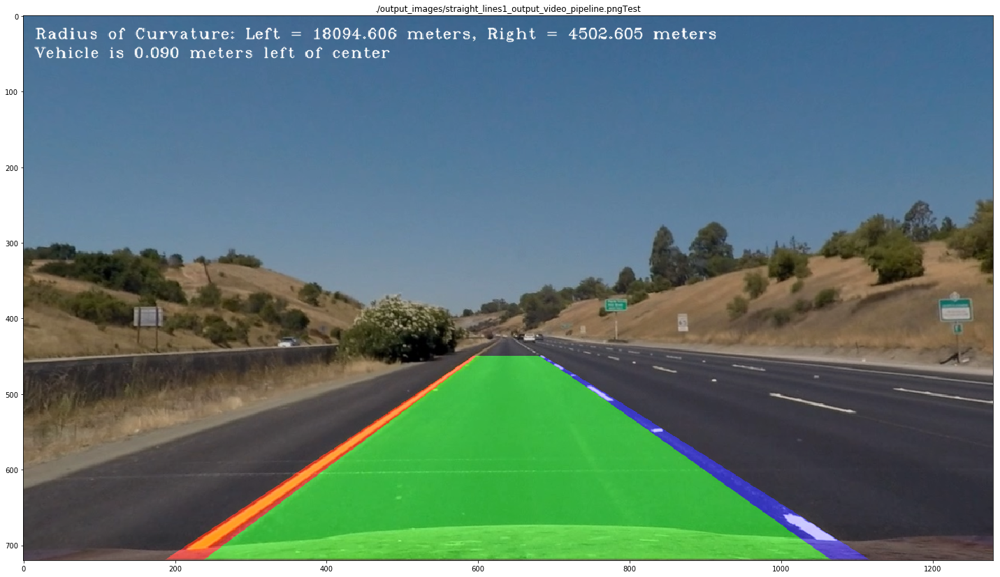

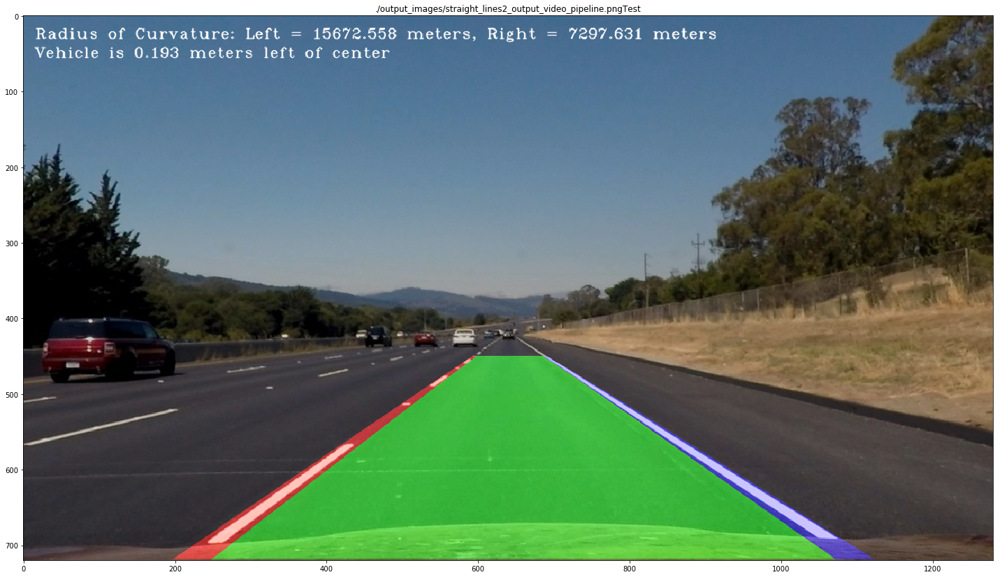

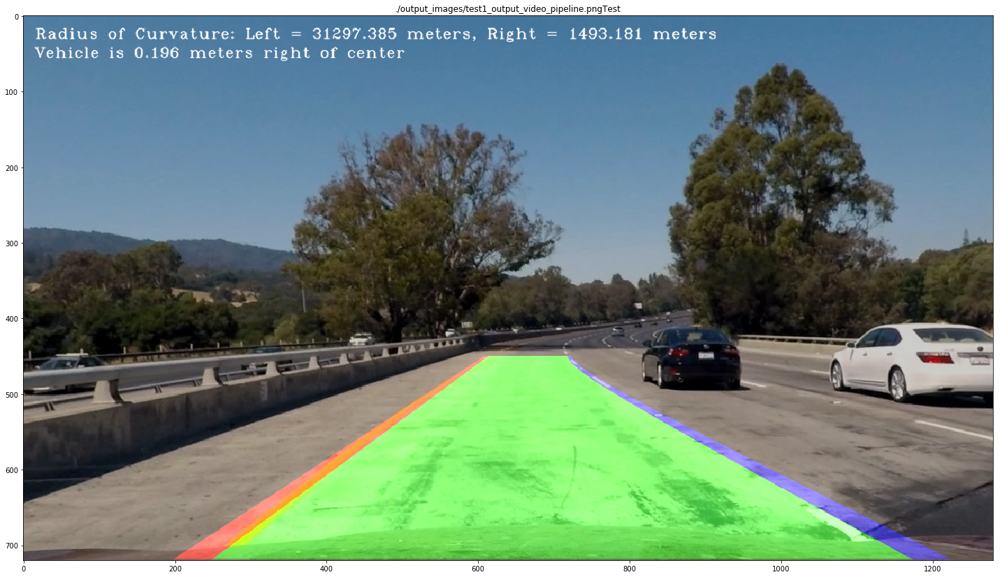

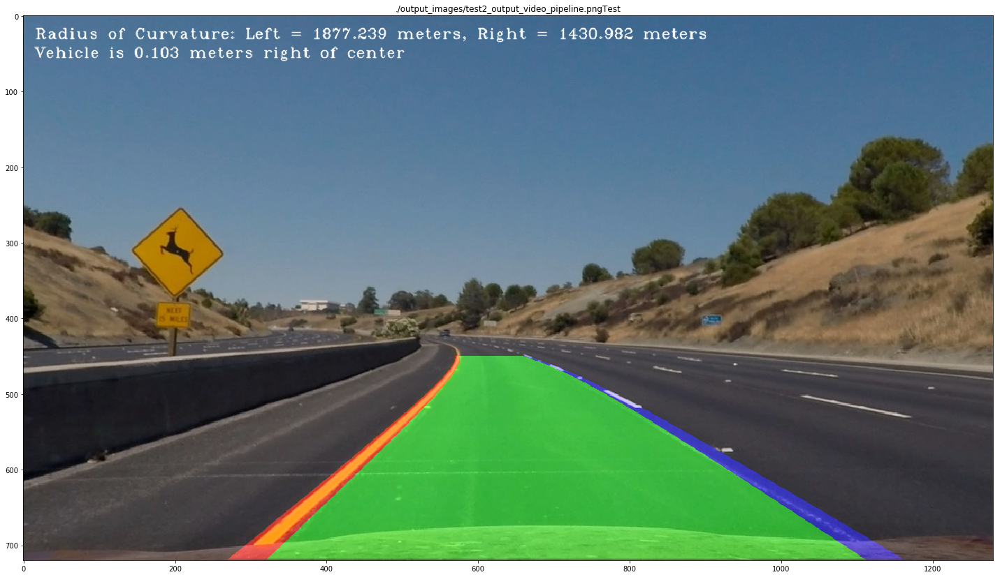

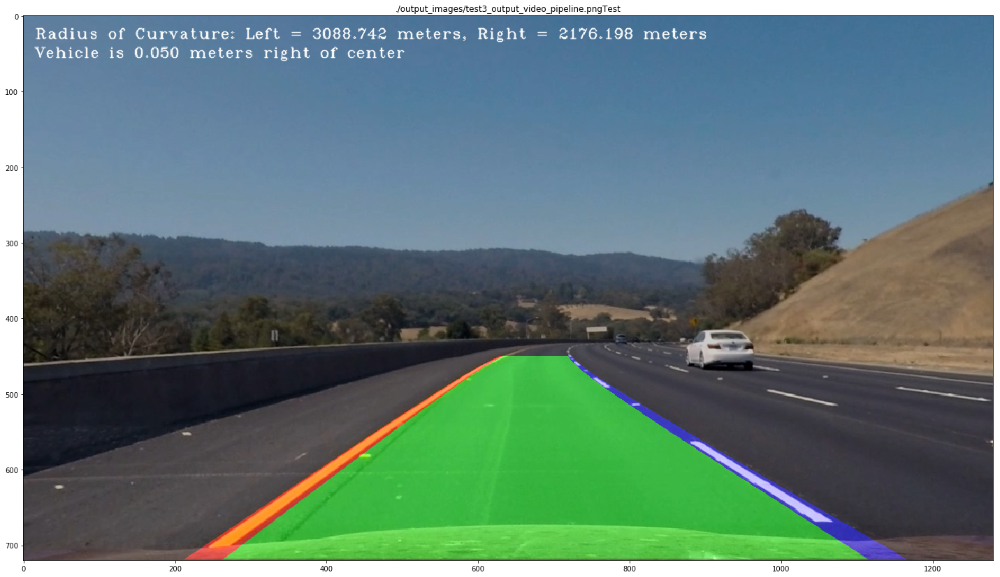

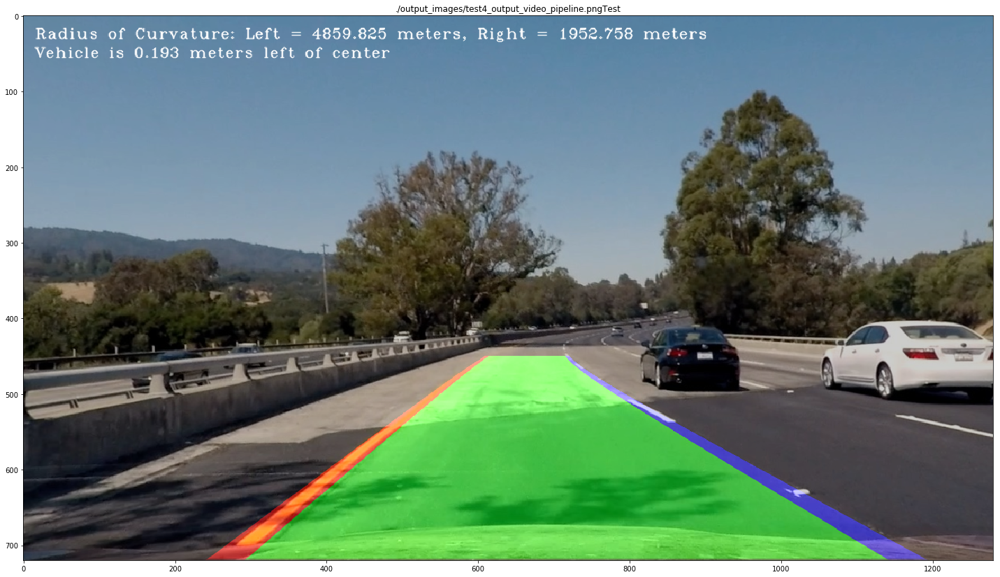

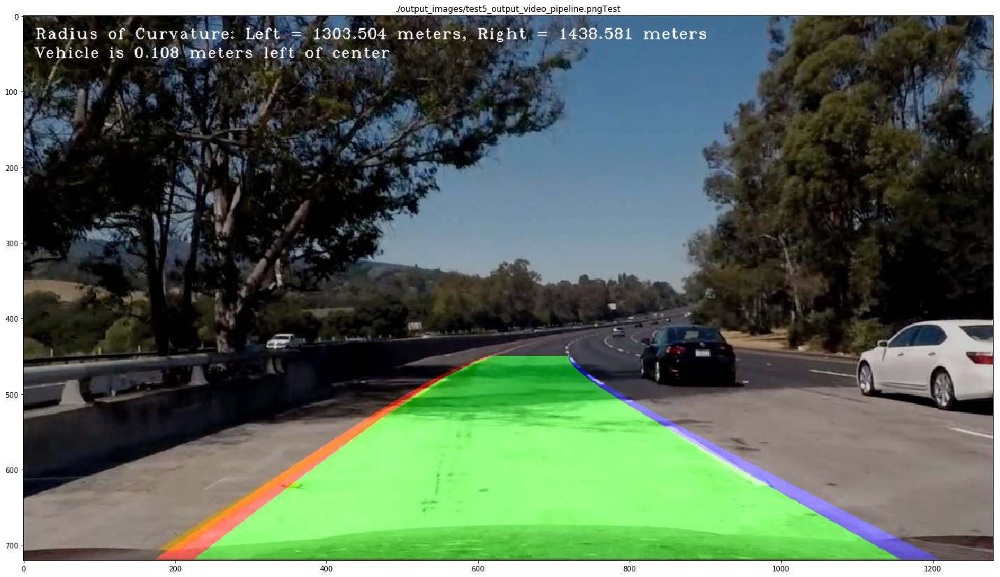

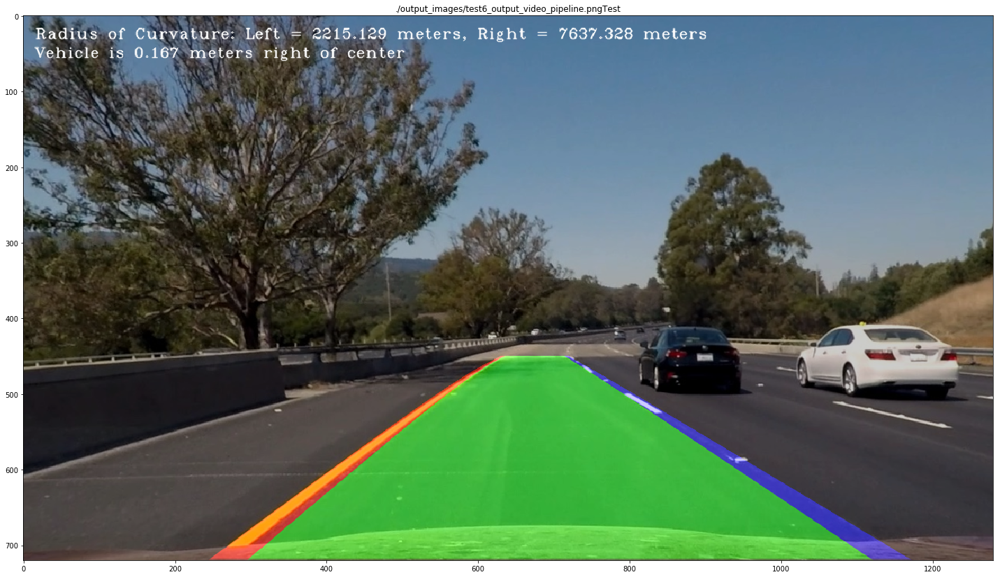

In [9]:
# Create Lane_Data class instance
LD = Lane_Data()

# Load images
images = sorted(glob.glob('./test_images/*.jpg'))
print("The video pipeline works on still images, too!  In fact, it's the best direct method of finding lane lines!")

for fname in images:
    img = cv2.imread(fname)
    pipe_out = video_pipeline(img)
    
    fname_out = fname.replace("./test_images/", 
                              "./output_images/")
    fname_out = fname_out.replace(".jpg", 
                                  "_output_video_pipeline.png")
    
    cv2.imwrite(fname_out, pipe_out)
    
    pipe_out = cv2.cvtColor(pipe_out, cv2.COLOR_BGR2RGB)
    
    # Plot the result:
    fig, ax = plt.subplots(1, 1, figsize=(20, 20))
    fig.tight_layout()
    ax.imshow(pipe_out)
    ax.set_title(fname_out + 'Test')
    

# This is the end of [P2_02_01_Video_Pipeline.ipynb](./P2_02_01_Video_Pipeline.ipynb)

All output videos can be found in the [./output_videos/](./output_videos/) folder.

All output images can be found in the [./output_images/](./output_images/) folder.